In [1]:
from skimage.io import imread, imshow
from skimage import transform
import numpy as np
import matplotlib.pyplot as plt

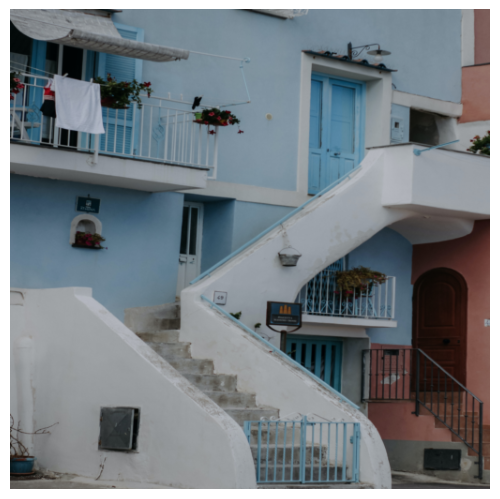

In [25]:
original_image = imread("pic.jpg")
original_image = transform.resize(original_image,(512,512))

plt.imshow(original_image, extent=[0, original_image.shape[1], 0, original_image.shape[0]])
plt.axis('off')
plt.gca().set_axis_off()
plt.tight_layout(pad=0)
plt.savefig('original.png', bbox_inches='tight', pad_inches=0)

In [3]:
blocks = []

dup_img = np.copy(original_image)

dim = 512
jmp = 16

for x in range(0, dim, jmp):
    for y in range(0, dim, jmp):
        box = dup_img[x:x+jmp, y:y+jmp]
        blocks.append(box)

In [4]:
for x in range(0,16):
    for y in range(0,16):
        blocks[31][x][y] = [255,255,255]

goal_blocks = list(blocks)

In [5]:
np.random.shuffle(blocks)
init_blocks = list(blocks)

In [6]:
def displayImage(blocks):
    # Reassemble the shuffled blocks into a single image
    img = np.zeros_like(dup_img)
    idx = 0
    for i in range(0, 512, 16):
        for j in range(0, 512, 16):
            img[i:i+16, j:j+16] = blocks[idx]
            idx += 1

    return img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


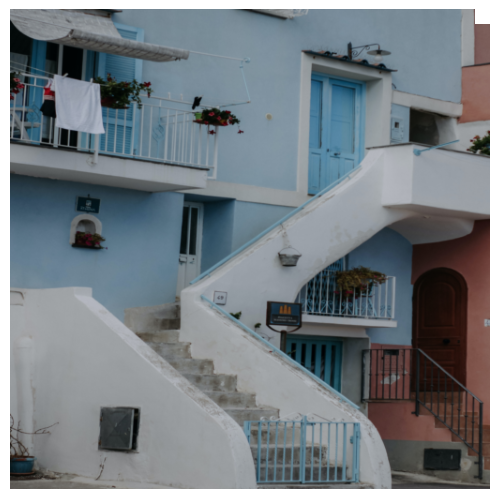

In [26]:
img = displayImage(goal_blocks)
plt.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])
plt.axis('off')
plt.gca().set_axis_off()
plt.tight_layout(pad=0)
plt.savefig('goal.png', bbox_inches='tight', pad_inches=0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


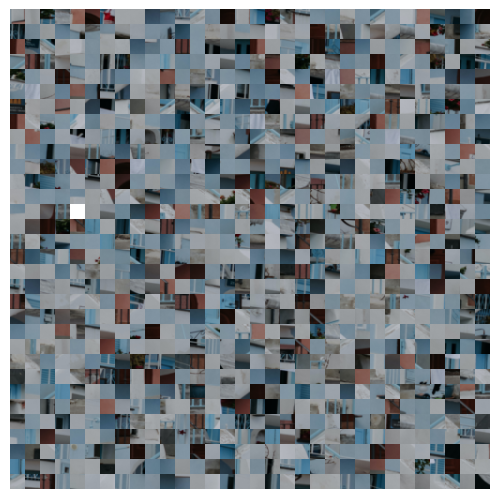

In [27]:
img = displayImage(init_blocks)
plt.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])
plt.axis('off')
plt.gca().set_axis_off()
plt.tight_layout(pad=0)
plt.savefig('init.png', bbox_inches='tight', pad_inches=0)

In [9]:
#Representing 16x16 boxes with a number to make comparison and computation easier
def findKey(arr):
    for key,value in encoded.items():
        if np.array_equal(value,arr):
            return key

b_id = 1
encoded = {}

for i in range(0,1024):

    if i == 31:
        encoded[0] = goal_blocks[i]
        continue

    encoded[b_id] = goal_blocks[i]
    b_id += 1

init = np.zeros((32, 32),dtype=int)
goal = np.zeros((32, 32),dtype=int)

iter = 0
for i in range(0,32):
    for j in range(0,32):

        arr = init_blocks[iter]
        id = findKey(arr)
        init[i][j] = id
        iter+=1

iter = 0
for i in range(0,32):
    for j in range(0,32):

        arr = goal_blocks[iter]
        id = findKey(arr)
        goal[i][j] = id
        iter+=1

In [10]:
def encoded2Image(arr):
    tempimg = np.zeros_like(dup_img)

    x = 0
    for i in range(0,32):
        y = 0
        for j in range(0,32):
            mapped_value = encoded[arr[i][j]]
            tempimg[x:x+16,y:y+16] = mapped_value
            y += 16
        x += 16
        

    imshow(tempimg)
    plt.show()#Forces the terminal to display image even of the code has not been fully executed

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


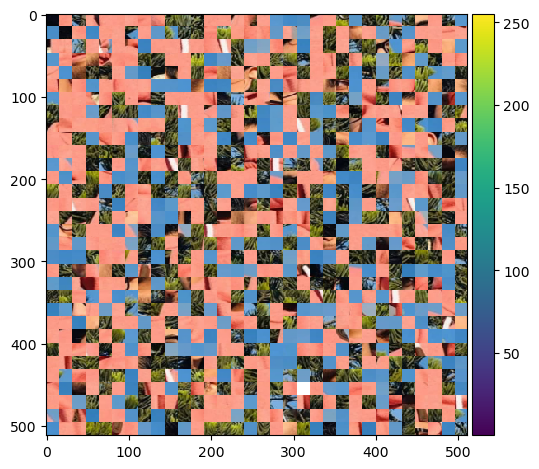

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


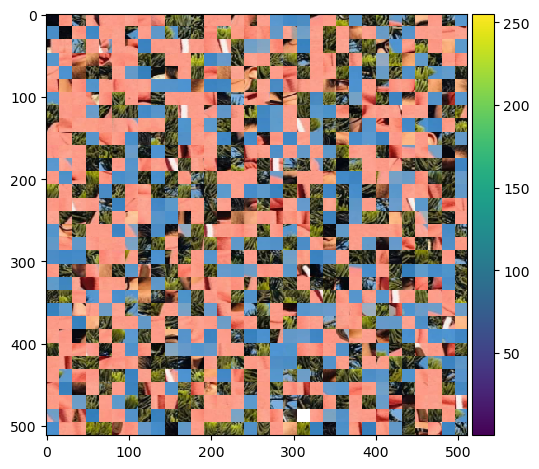

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


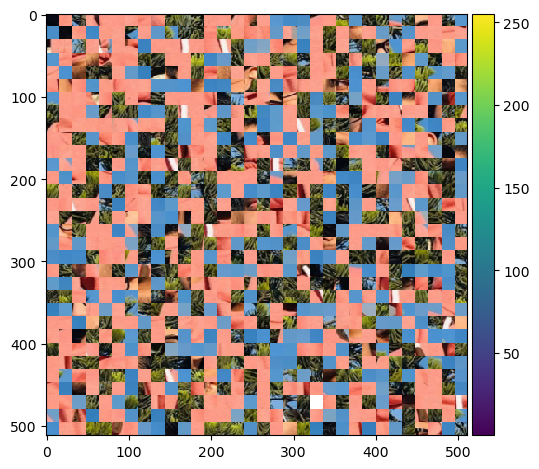

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


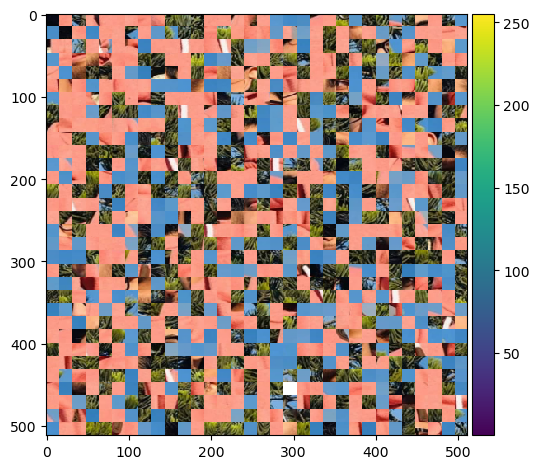

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


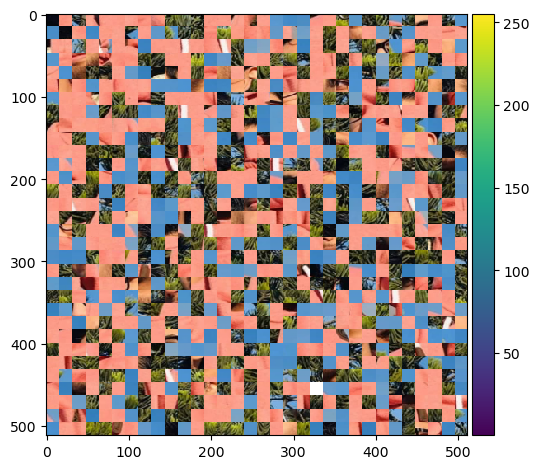

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


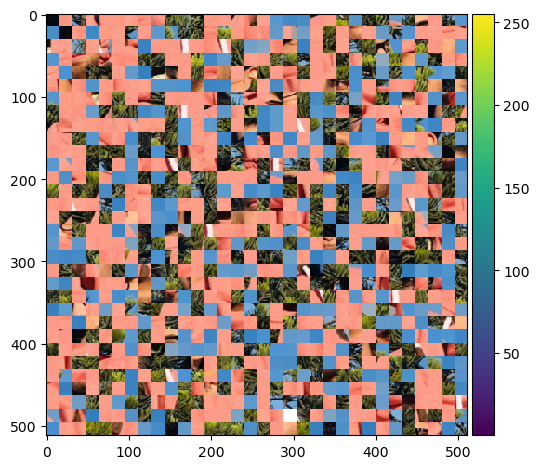

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


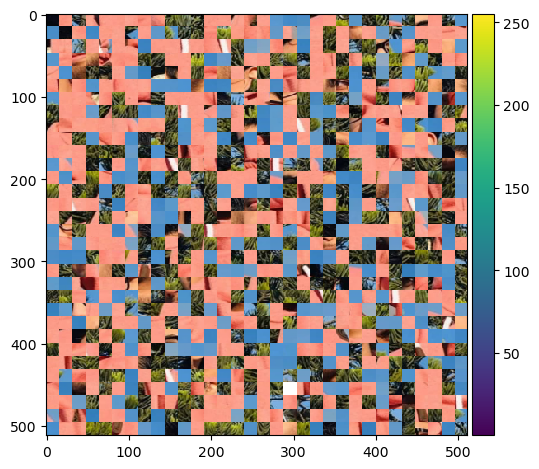

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


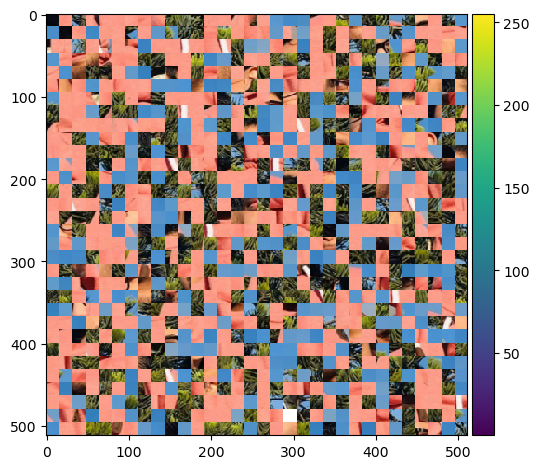

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


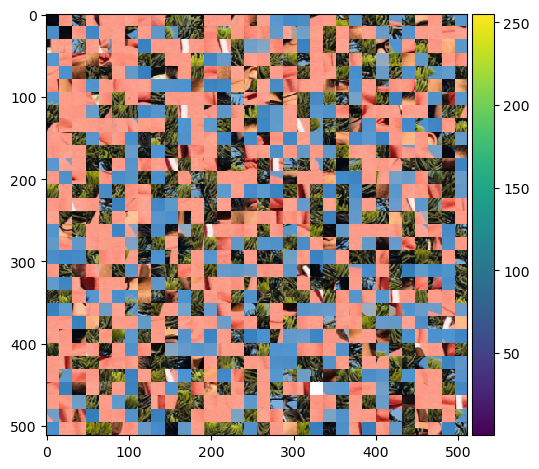

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


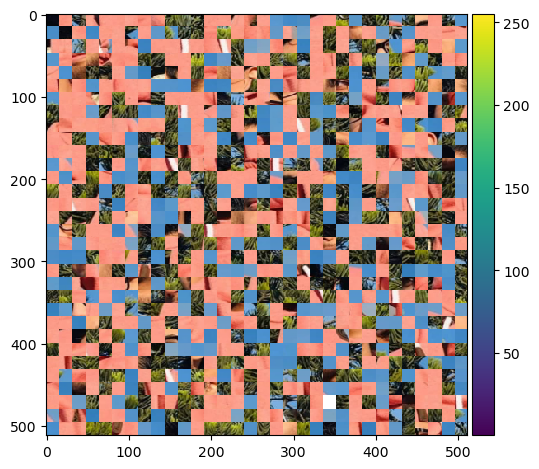

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


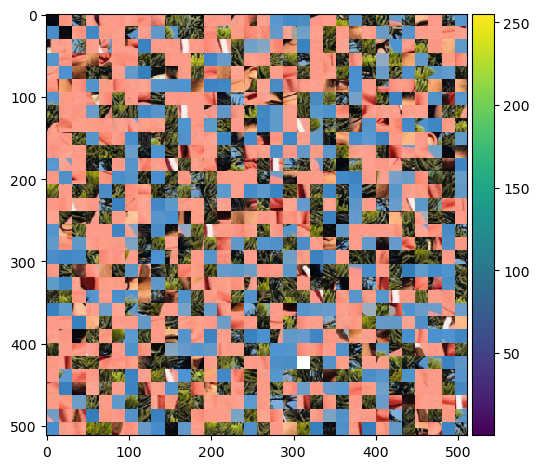

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


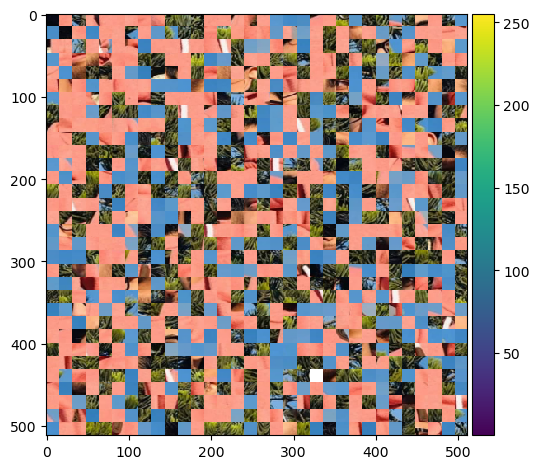

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


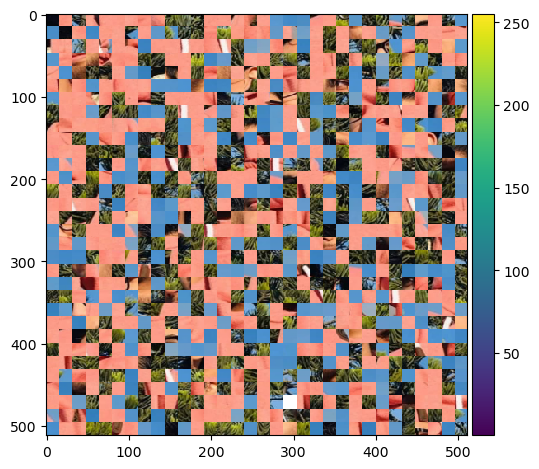

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


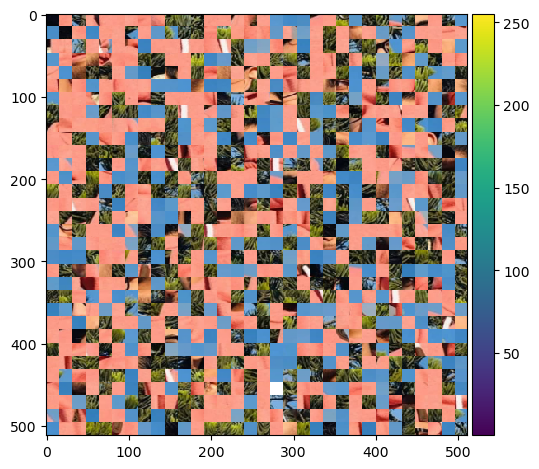

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


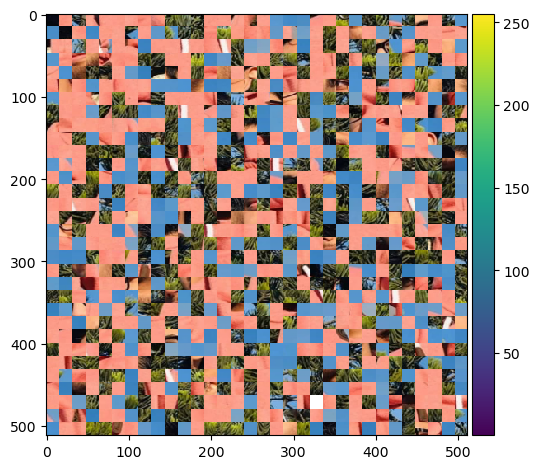

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


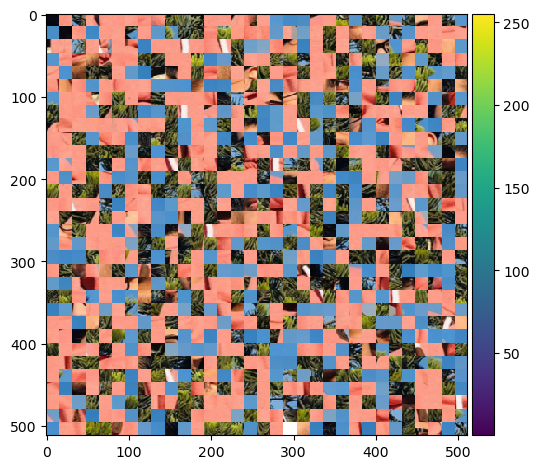

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


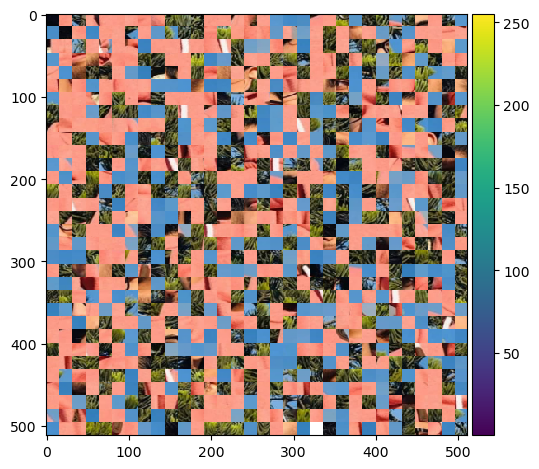

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


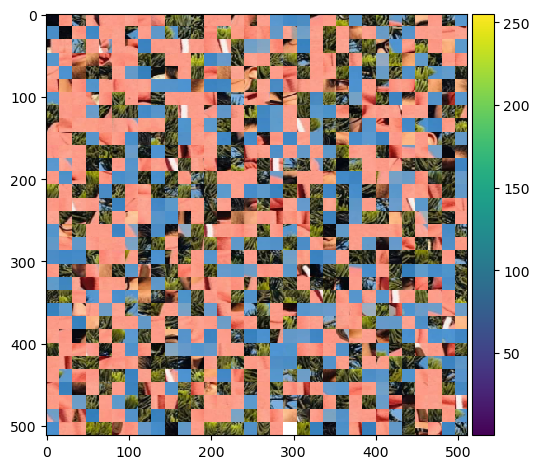

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


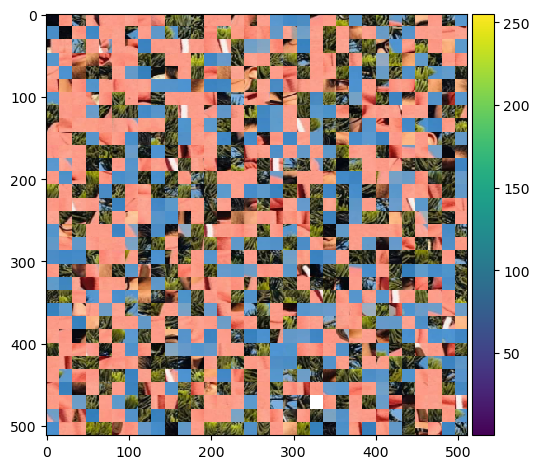

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


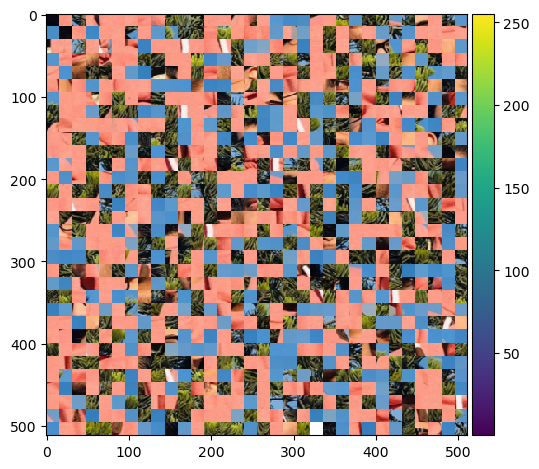

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


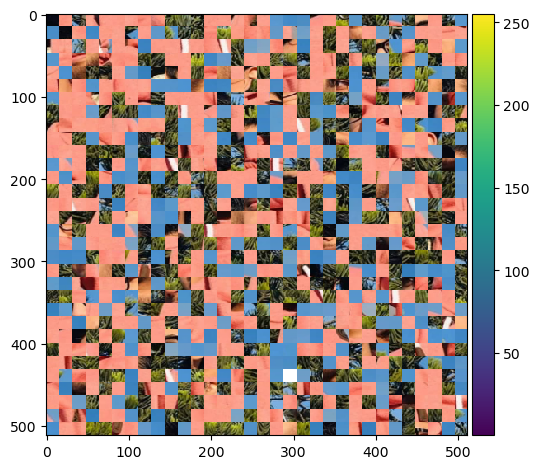

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


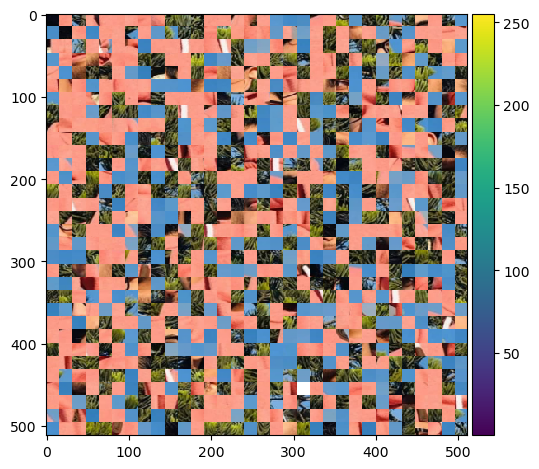

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


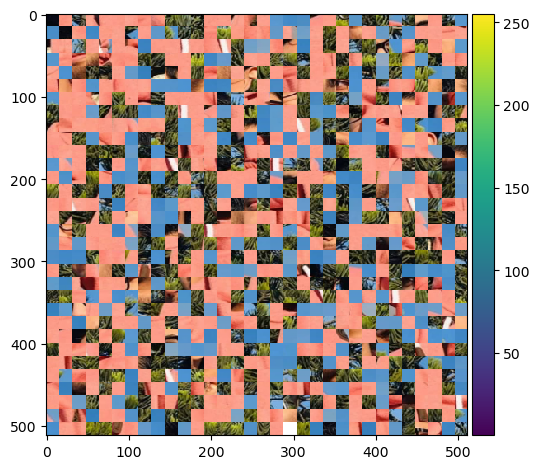

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


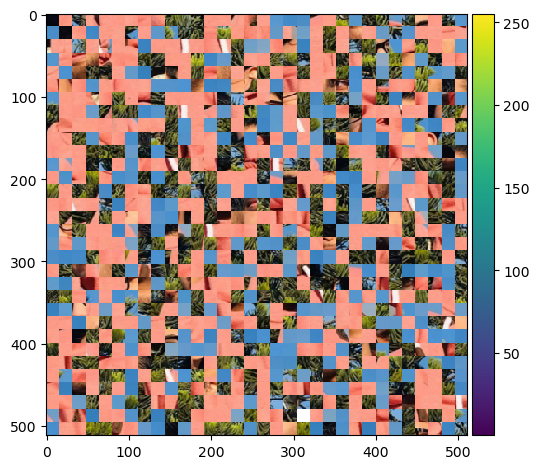

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


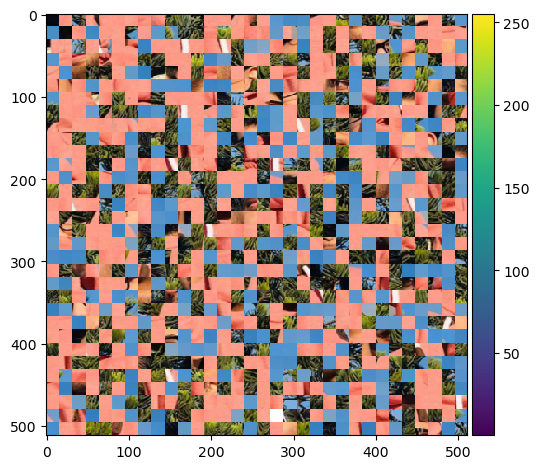

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


KeyboardInterrupt: 

In [11]:
#Solving 8 Puzzle Problem
col = 32
check = 0

open_lis = [] #Piriority Queue
close_lis = []
moves = ["Up","Down","Left","Right"]

def costidx(n):  
    return n[1] 

def setPriority(lis): #Updates the whole Piriority Queue based on cost
    return sorted(lis,key=costidx)


def calCost(state): #Calculate Cost of the State
    return np.count_nonzero(np.not_equal(state, goal))


def findSpace(state):
    
    index = np.where(state == 0)
    row = index[0][0]
    col = index[1][0]

    return row,col

def generateStates(state,move):
    new_state = np.copy(state) 
    x,y = findSpace(state)  #Coordinates of empty space

    if move == "Up":
        if x != 0:      #Space not on top of the grid
            new_state[x][y],new_state[x-1][y] = new_state[x-1][y],new_state[x][y]
        
        return new_state

    elif move == "Down": 
        if x != col-1:      #Space not on the bottom of the grid
            new_state[x][y],new_state[x+1][y] = new_state[x+1][y],new_state[x][y]
        return new_state

    elif move == "Right":
        if y != col-1:    #Space not on rightmost position of the grid
            new_state[x][y],new_state[x][y+1] = new_state[x][y+1],new_state[x][y]  
        return new_state

    elif move == "Left":
        if y != 0:        #Space not on the leftmost position of the grid
            new_state[x][y],new_state[x][y-1] = new_state[x][y-1],new_state[x][y]  
        return new_state

def repeatedState(state):
    for arr,cost in open_lis:
        if np.array_equal(arr,state):
            return True

    for arr,cost in close_lis:
        if np.array_equal(arr,state):
            return True

    return False

def Astar():

    global open_lis
    global check

    if np.array_equal(init,goal):
        print(init,goal)
        return []

    init_cost = calCost(init)

    open_lis.append((init,init_cost))

    while len(open_lis)>0:
        arr,cost = open_lis.pop(0)

        if np.array_equal(arr,goal):
            # print("Found")
            close_lis.append((arr,cost))
            break

        for i in moves:
            newarr = generateStates(arr,i)

            if repeatedState(newarr):
                continue

            open_lis.append((newarr,calCost(newarr)))

        open_lis = setPriority(open_lis)
        close_lis.append((arr,cost))

    return close_lis[-1][0]

encoded2Image(Astar())